# Draft Version

Analyzing body with Gemini 2.5 Flash...
Body analysis JSON:
 {
  "estimated_height_in": 66,
  "bust_or_chest_in": 41,
  "waist_in": 35,
  "hip_in": 43,
  "build": "curvy",
  "posture_notes": "Good posture, standing straight with shoulders relaxed.",
  "confidence_0_to_1": 0.75
}
Will generate try-on for sizes: ['XS', 'S', 'M', 'L', 'XL']
Generating try-ons in parallel (max_workers=5)...
[Worker] Generating size XS ...
[Worker] Generating size S ...
[Worker] Generating size M ...
[Worker] Generating size L ...
[Worker] Generating size XL ...
✓ Finished: size XL
✓ Finished: size XS
✓ Finished: size L
✓ Finished: size S
✓ Finished: size M

Best fit size could not be determined reliably.




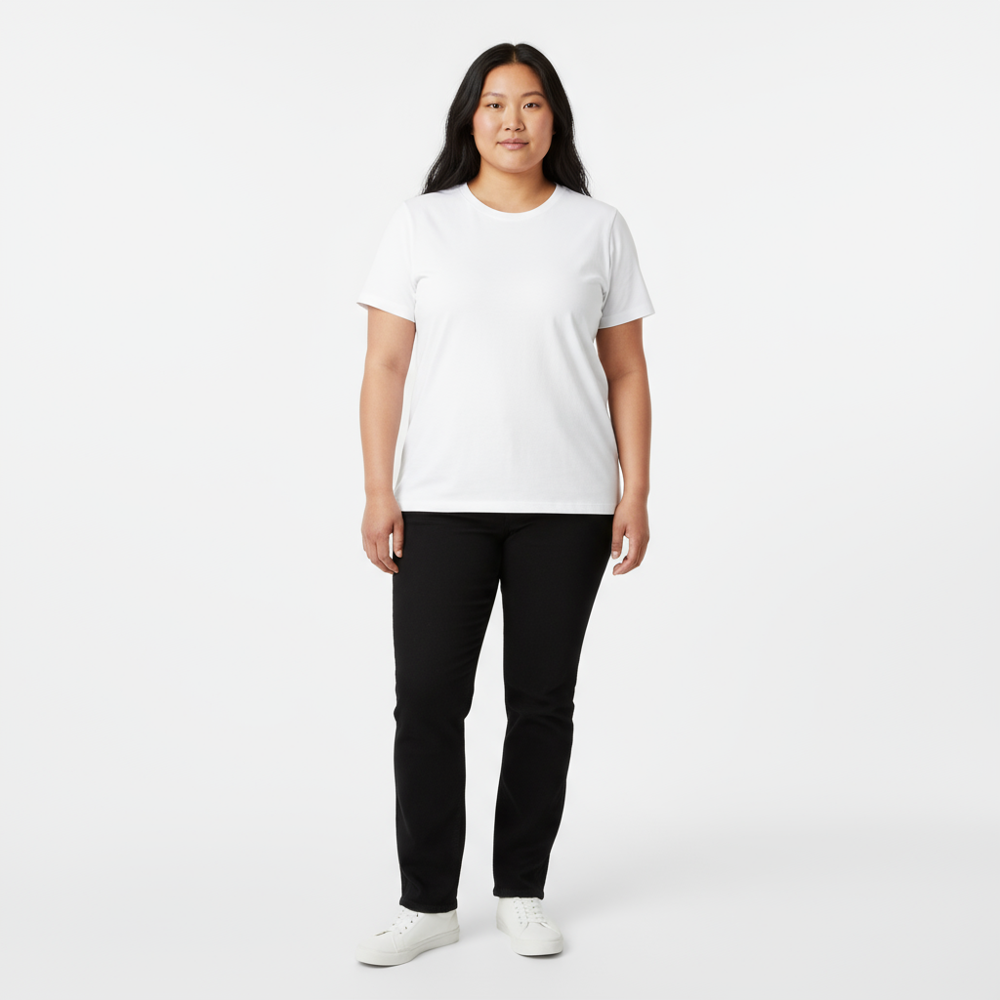
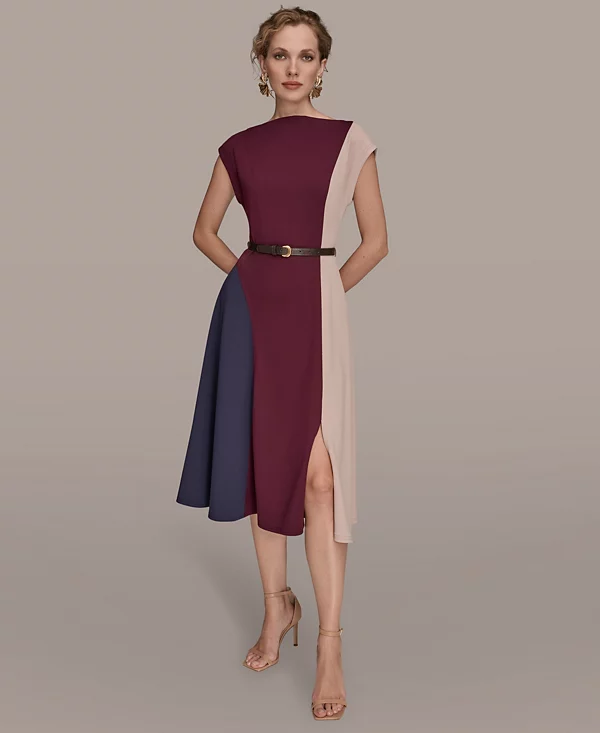
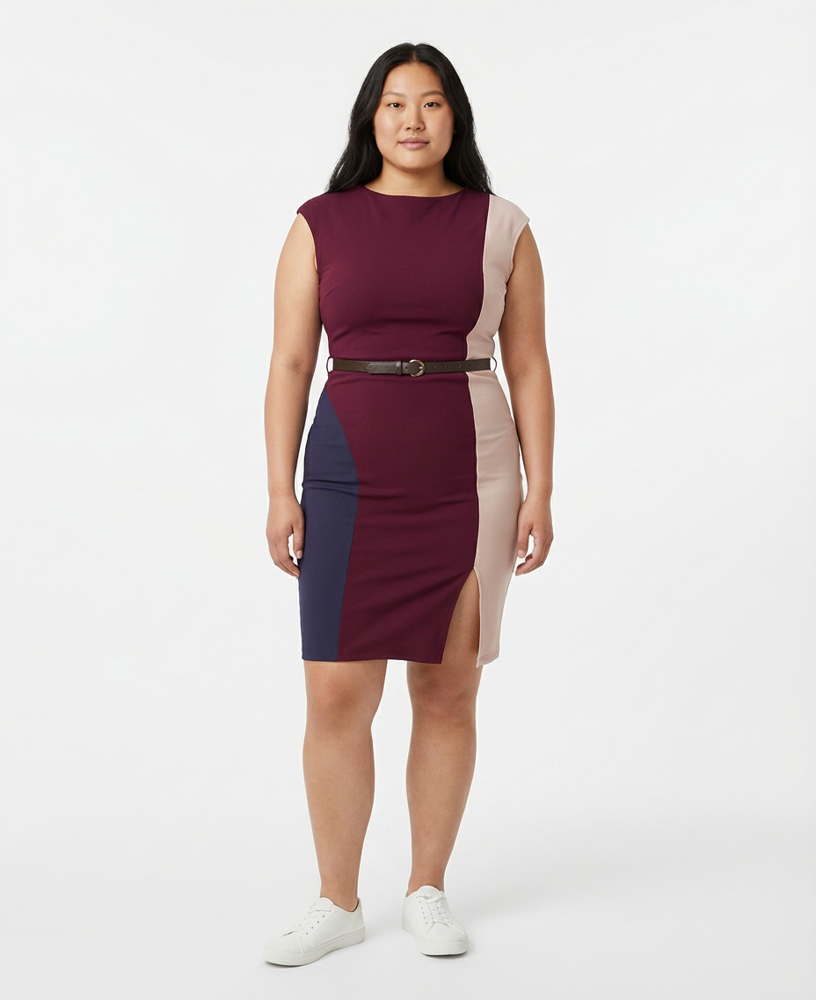
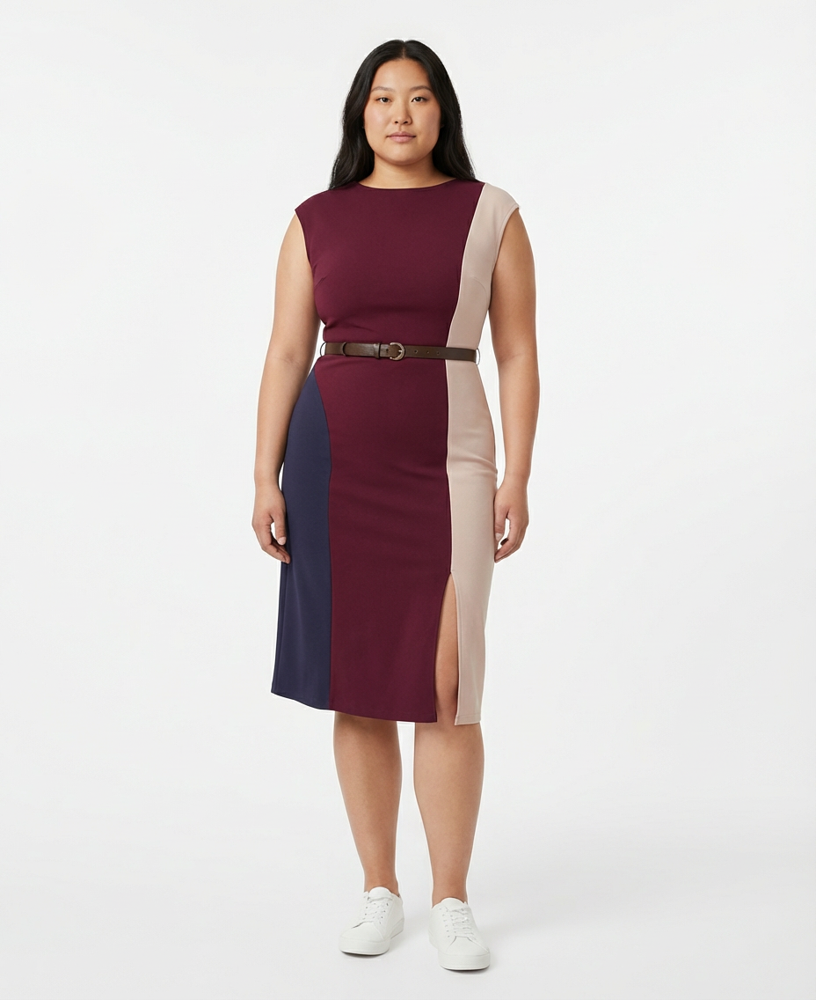
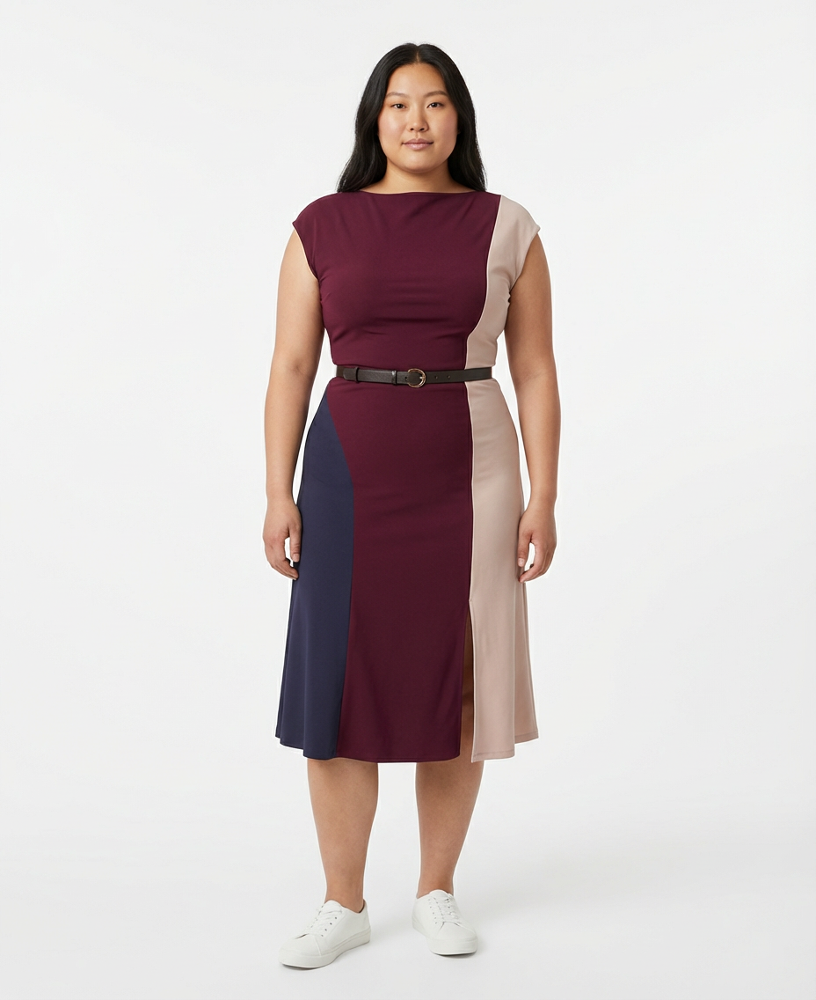
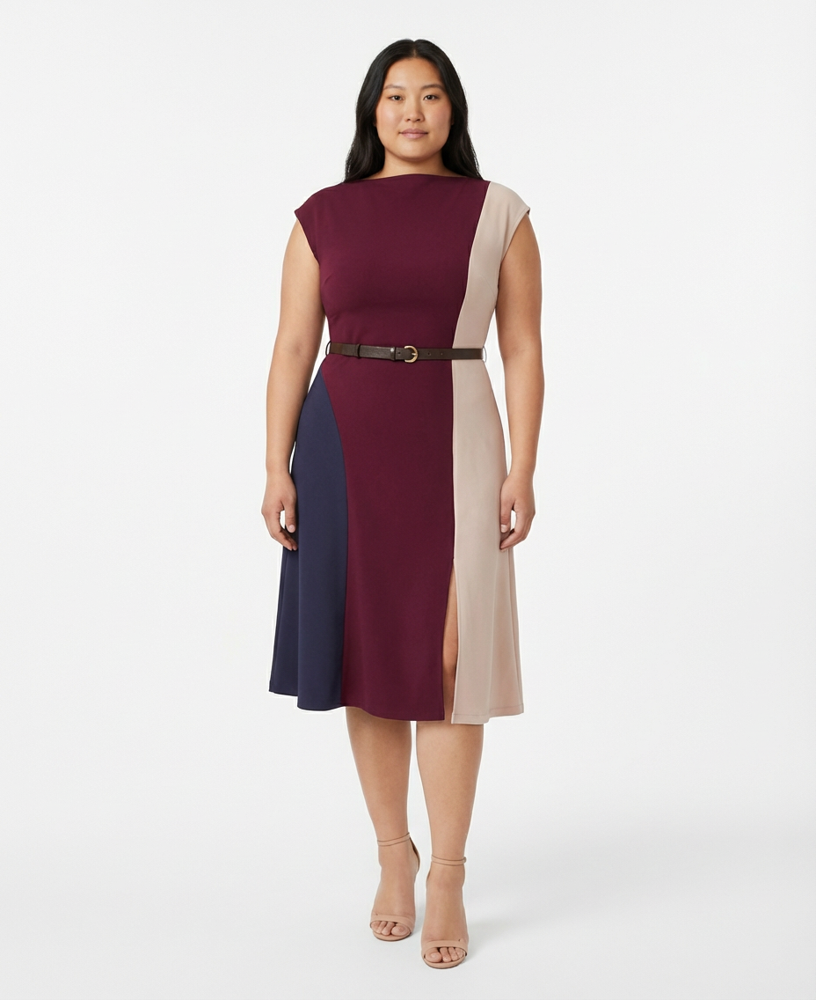
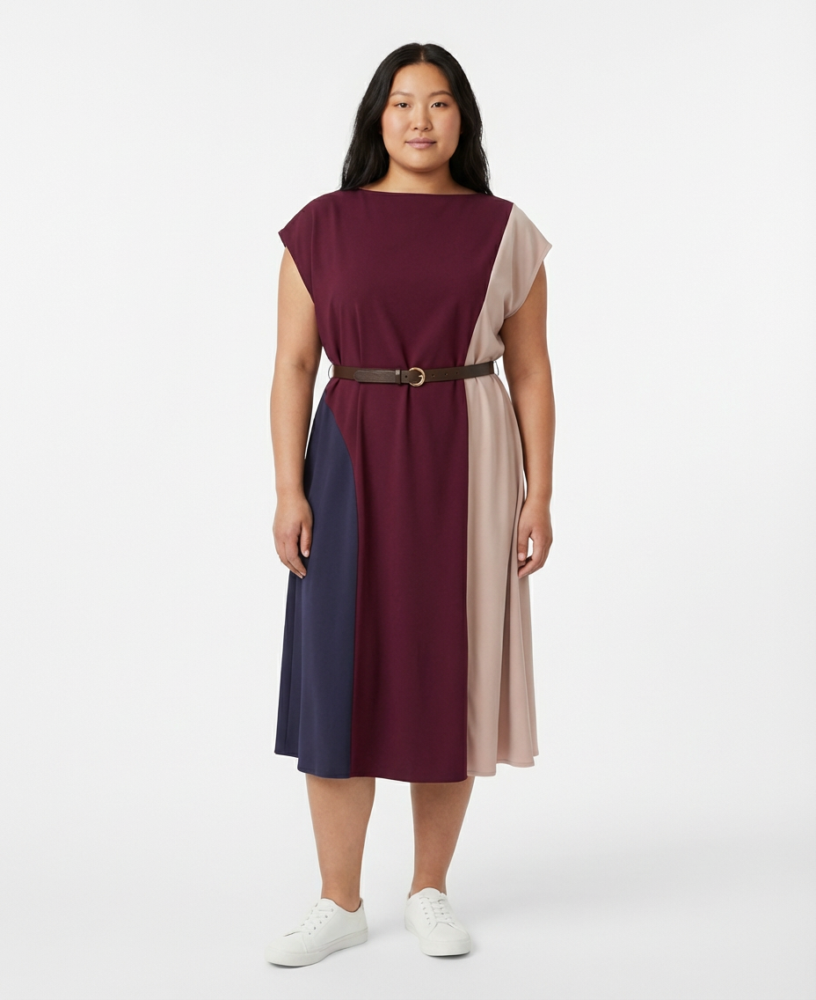

In [30]:
import os
import json
import base64
from typing import List, Dict, Tuple
from concurrent.futures import ThreadPoolExecutor, as_completed
from google import genai
from google.genai.types import GenerateContentConfig, Modality, Part
from google.cloud import storage

from IPython.display import HTML, display


# ====================================================
# CONFIG
# ====================================================
PROJECT_ID = os.getenv("GOOGLE_CLOUD_PROJECT", "consumer-genai-experiments")

# Use us-central1 for 2.5 Flash (works today)
ANALYSIS_LOCATION = os.getenv("GOOGLE_CLOUD_LOCATION", "us-central1")

# Gemini 3 Pro Image Preview is global-only in preview
VTO_LOCATION = "global"

ANALYSIS_MODEL = "gemini-2.5-flash"            # for body measurements + size selection
VTO_MODEL      = "gemini-3-pro-image-preview"  # for virtual try-on images


# Two separate clients (NO API key used; vertexai=True)
client_flash = genai.Client(
    vertexai=True,
    project=PROJECT_ID,
    location=ANALYSIS_LOCATION,
)

client_vto = genai.Client(
    vertexai=True,
    project=PROJECT_ID,
    location=VTO_LOCATION,
)

storage_client = storage.Client(project=PROJECT_ID)


# ====================================================
# BASIC HELPERS
# ====================================================
def load_local_image(path: str) -> bytes:
    with open(path, "rb") as f:
        return f.read()


def load_gcs_image(gs_path: str) -> bytes:
    """Load image bytes from a gs://bucket/path URL."""
    assert gs_path.startswith("gs://")
    bucket_name, blob_path = gs_path[5:].split("/", 1)
    bucket = storage_client.bucket(bucket_name)
    blob = bucket.blob(blob_path)
    return blob.download_as_bytes()


def load_product_info_text(path: str) -> str:
    """
    Load product information from a local file.
    - If it's JSON, pretty-print it.
    - Otherwise, treat as plain text.
    """
    if not path or not os.path.exists(path):
        return ""

    _, ext = os.path.splitext(path)
    ext = ext.lower()

    with open(path, "r", encoding="utf-8") as f:
        raw = f.read()

    if ext == ".json":
        try:
            obj = json.loads(raw)
            return json.dumps(obj, indent=2)
        except Exception:
            return raw

    # Truncate to keep prompt reasonable
    return raw[:6000]


def _image_part(image_bytes: bytes, mime_type: str = "image/png") -> Part:
    return Part.from_bytes(
        data=image_bytes,
        mime_type=mime_type,
    )


def _extract_image_bytes(response) -> bytes:
    """Return first inline_data image bytes from a Gemini response."""
    for cand in getattr(response, "candidates", []):
        content = getattr(cand, "content", None)
        if not content:
            continue
        for part in getattr(content, "parts", []):
            inline = getattr(part, "inline_data", None)
            if inline is not None and getattr(inline, "data", None) is not None:
                return inline.data
    raise RuntimeError("No image inline_data found in Gemini response")


def _extract_text(response) -> str:
    """Return concatenated text from a Gemini response."""
    texts = []
    for cand in getattr(response, "candidates", []):
        content = getattr(cand, "content", None)
        if not content:
            continue
        for part in getattr(content, "parts", []):
            if getattr(part, "text", None):
                texts.append(part.text)
    if not texts and hasattr(response, "text") and response.text:
        return response.text
    if not texts:
        raise RuntimeError("No text found in Gemini response")
    return "\n".join(texts).strip()


def _strip_md_fence(text: str) -> str:
    """
    Strip ``` or ```json fences if Gemini returns markdown-formatted JSON.
    """
    t = text.strip()
    if t.startswith("```"):
        lines = t.splitlines()
        # drop first line (``` or ```json)
        lines = lines[1:]
        # drop last fence if present
        if lines and lines[-1].strip().startswith("```"):
            lines = lines[:-1]
        return "\n".join(lines).strip()
    return t


# ====================================================
# 1) BODY ANALYSIS (Gemini 2.5 Flash)
# ====================================================
BODY_ANALYSIS_PROMPT = """
You are a fashion fit and body measurement assistant.

You receive a single PERSON_IMAGE of one person standing.
From just this image, estimate the person's body in the most realistic and practical way possible.

Return a SHORT JSON object only (no explanation text) with keys:

{
  "estimated_height_in": number,        // person's approximate height in inches
  "bust_or_chest_in": number,          // fullest part of chest/bust
  "waist_in": number,                  // natural waist
  "hip_in": number,                    // fullest part of hips
  "build": "slim|medium|curvy|broad|athletic",
  "posture_notes": "string",
  "confidence_0_to_1": number          // how confident you are in these estimates
}

Rules:
- Use reasonable, fashion-relevant ranges (for example: height 58-74 inches, etc.).
- If unsure, still give your best numeric estimate rather than writing 'unknown'.
- Do NOT wrap JSON in backticks. Output must be plain JSON only.
""".strip()


def analyze_body_with_flash(
    person_bytes: bytes,
    person_mime: str = "image/png",
) -> str:
    """
    Use Gemini 2.5 Flash to estimate the person's body measurements from the image.

    Returns: JSON string with keys:
      estimated_height_in, bust_or_chest_in, waist_in, hip_in, build, posture_notes, confidence_0_to_1
    """
    person_part = _image_part(person_bytes, mime_type=person_mime)

    response = client_flash.models.generate_content(
        model=ANALYSIS_MODEL,
        contents=[person_part, BODY_ANALYSIS_PROMPT],
        config=GenerateContentConfig(
            temperature=0.2,
            response_modalities=[Modality.TEXT],
        ),
    )

    body_json = _extract_text(response)
    body_json = _strip_md_fence(body_json)
    return body_json


# ====================================================
# 2) SIZE SELECTION (base size + which sizes to try)
# ====================================================
SIZE_SELECTION_PROMPT = """
You are a senior fashion fit expert.

You receive:

ESTIMATED_BODY_MEASUREMENTS_JSON:
{body_measurements_json}

PRODUCT_INFO_TEXT:
\"\"\"{product_info_text}\"\"\"

AVAILABLE_SIZES: [{available_sizes}]

Goals:
1) Infer the approximate base size for this model in THIS SPECIFIC GARMENT,
   taking into account body measurements AND the product info (fabric, stretch,
   cut, intended fit, etc.).
2) Decide which sizes are realistically TRY-ON-ABLE for this model.
   - Slightly tight or slightly loose is OK for try-on.
   - If a size would be physically impossible (for example, model is effectively XXL
     and size XS could not close at all or vice versa), mark that size as SKIPPED.
3) Prefer natural, realistic fit decisions over extreme distortion.

Return JSON ONLY (no commentary) in this shape:

{{
  "base_size": "XS|S|M|L|XL|XXL|null",
  "try_on_sizes": ["sizes from AVAILABLE_SIZES that are reasonable to render"],
  "skipped_sizes": ["sizes from AVAILABLE_SIZES that are unrealistic"],
  "reason": "short, one liner for each size"
}}

Rules:
- The union of try_on_sizes and skipped_sizes must cover ONLY values from AVAILABLE_SIZES.
- If you are unsure, err on the side of INCLUDING a size in try_on_sizes.
- If the model appears larger than the smallest sizes (e.g., effectively XXL vs XS),
  you MAY put that size into skipped_sizes.
- Output must be valid JSON, not wrapped in backticks.
""".strip()


def select_tryon_sizes(
    body_measurements_json: str,
    product_info_text: str,
    sizes: List[str],
) -> Tuple[List[str], str, str]:
    """
    Use Gemini 2.5 Flash (text) to choose which sizes to actually try on.

    Returns:
      (try_on_sizes, base_size, reason)
    """
    if not product_info_text:
        # No extra info – use all sizes, no special base size
        return sizes, None, "No product info provided; all sizes used."

    prompt = SIZE_SELECTION_PROMPT.format(
        body_measurements_json=body_measurements_json,
        product_info_text=product_info_text[:4000],
        available_sizes=", ".join(sizes),
    )

    response = client_flash.models.generate_content(
        model=ANALYSIS_MODEL,
        contents=[prompt],
        config=GenerateContentConfig(
            temperature=0.1,
            response_modalities=[Modality.TEXT],
        ),
    )

    text = _extract_text(response)
    text = _strip_md_fence(text)

    base_size = None
    reason = ""
    try:
        data = json.loads(text)

        base_size = data.get("base_size") or data.get("baseSize")
        reason = data.get("reason", "")

        raw_try = (
            data.get("try_on_sizes")
            or data.get("tryOnSizes")
            or data.get("valid_sizes")
            or []
        )

        # Keep original ordering
        try_on_sizes = [s for s in sizes if s in raw_try]
        if not try_on_sizes:
            try_on_sizes = sizes

        skipped = [s for s in sizes if s not in try_on_sizes]

        print("Size selection decision:", json.dumps(data, indent=2))
        if skipped:
            print("Skipping sizes (not relevant / impossible):", skipped)

        return try_on_sizes, base_size, reason or ""
    except Exception as e:
        print("Failed to parse size selection JSON:", e)
        print("Raw response:", text)
        # Fallback: use all sizes
        return sizes, None, "Could not parse size selection JSON; using all sizes."


# ====================================================
# 3) VTO PROMPT (uses body JSON + size guide + product info)
# ====================================================
VTO_PROMPT_TEMPLATE = """
You are a fashion virtual try-on engine.

Inputs you receive:
1) PERSON_IMAGE (real person).
2) OUTFIT_IMAGE (product photo).
3) BRAND_SIZE_GUIDE_IMAGE (table with Size | Bust (in) | Waist (in) | Hip (in)).
4) TARGET_SIZE (size we want to generate: XS, S, M, L, XL, etc.).
5) OUTFIT_TYPE (dress, t-shirt, jeans, etc.).
6) ESTIMATED_BODY_MEASUREMENTS_JSON from a previous expert model:

{body_measurements_json}

7) PRODUCT_INFO_TEXT describing the garment's fabric, stretch, structure, drape,
   style, and how it is intended to fit (slim, relaxed, bodycon, oversized, etc.):

\"\"\"{product_info_text}\"\"\"

Your tasks:

1. Use ESTIMATED_BODY_MEASUREMENTS_JSON as the primary reference for the person's body:
   - Height
   - Bust/chest
   - Waist
   - Hips
   - Build (e.g., curvy, athletic)

2. Read the BRAND_SIZE_GUIDE_IMAGE very carefully.
   From the size chart, determine the person's best 'true size' based on the estimated measurements.

3. Also use PRODUCT_INFO_TEXT to understand:
   - How stretchy or rigid the fabric is.
   - How structured vs drapey the garment is.
   - Whether the design is meant to be bodycon, fitted, relaxed, oversized, etc.

4. For TARGET_SIZE:
   - If TARGET_SIZE is smaller than the best size → garment should look tight:
     • pulling across bust/waist/hips
     • tension lines and snug sleeves
   - If TARGET_SIZE matches the best size → garment should look perfect:
     • comfortable ease
     • no pulling, no excess fabric
   - If TARGET_SIZE is larger than the best size → garment should look loose:
     • extra ease and drape
     • slightly more relaxed, roomier shape

   Use PRODUCT_INFO_TEXT so that the tightness/looseness is realistic for this fabric and style.

5. Preserve:
   - Person’s face, skin tone, body shape, pose, background
   - Outfit color, pattern, fabric details

6. Strict rule:
   - Do NOT modify the person’s body proportions to force fit.
   - Only adjust the garment fit (tight/loose, wrinkles, drape).

Generate ONE highly realistic try-on image for the given TARGET_SIZE and OUTFIT_TYPE.

TARGET_SIZE: {target_size}
OUTFIT_TYPE: {outfit_type}
""".strip()


def generate_tryon_for_size(
    person_bytes: bytes,
    outfit_bytes: bytes,
    sizeguide_bytes: bytes,
    *,
    body_measurements_json: str,
    target_size: str,
    outfit_type: str,
    product_info_text: str = "",
    person_mime: str = "image/png",
    outfit_mime: str = "image/png",
    size_mime: str = "image/png",
) -> bytes:
    """
    Generate a single virtual try-on for a specific size.
    """
    prompt = VTO_PROMPT_TEMPLATE.format(
        target_size=target_size,
        outfit_type=outfit_type,
        body_measurements_json=body_measurements_json,
        product_info_text=product_info_text or "No extra product info provided.",
    )

    person_part    = _image_part(person_bytes,    mime_type=person_mime)
    outfit_part    = _image_part(outfit_bytes,    mime_type=outfit_mime)
    sizeguide_part = _image_part(sizeguide_bytes, mime_type=size_mime)

    contents = [
        person_part,
        outfit_part,
        sizeguide_part,
        prompt,
    ]

    response = client_vto.models.generate_content(
        model=VTO_MODEL,
        contents=contents,
        config=GenerateContentConfig(
            temperature=0.5,
            response_modalities=[Modality.IMAGE],
        ),
    )

    return _extract_image_bytes(response)


# ====================================================
# 4) MULTI-SIZE GENERATION (parallel, up to 5 at a time)
# ====================================================
def generate_tryon_for_sizes(
    person_bytes: bytes,
    outfit_bytes: bytes,
    sizeguide_bytes: bytes,
    sizes: List[str],
    outfit_type: str,
    product_info_text: str = "",
    *,
    person_mime: str = "image/png",
    outfit_mime: str = "image/png",
    size_mime: str = "image/png",
) -> Tuple[Dict[str, bytes], str, str]:
    """
    Full pipeline:
      1) Analyze body (once)
      2) Select sizes (base size + try_on_sizes)
      3) Generate try-ons in parallel (max_workers=5)

    Returns:
      results: {size_label -> bytes}
      best_size: str or None
      best_reason: explanation string
    """
    # --- Step 1: Body analysis
    print("Analyzing body with Gemini 2.5 Flash...")
    body_json = analyze_body_with_flash(person_bytes, person_mime=person_mime)
    print("Body analysis JSON:\n", body_json)

    # --- Step 2: Decide sizes to actually generate
    sizes_to_use, best_size, best_reason = select_tryon_sizes(
        body_json,
        product_info_text,
        sizes,
    )
    print("Will generate try-on for sizes:", sizes_to_use)

    results: Dict[str, bytes] = {}

    # --- Step 3: Parallel generation
    print("Generating try-ons in parallel (max_workers=5)...")

    def job(size_label: str):
        print(f"[Worker] Generating size {size_label} ...")
        img_bytes = generate_tryon_for_size(
            person_bytes=person_bytes,
            outfit_bytes=outfit_bytes,
            sizeguide_bytes=sizeguide_bytes,
            body_measurements_json=body_json,
            target_size=size_label,
            outfit_type=outfit_type,
            product_info_text=product_info_text,
            person_mime=person_mime,
            outfit_mime=outfit_mime,
            size_mime=size_mime,
        )
        return size_label, img_bytes

    with ThreadPoolExecutor(max_workers=5) as executor:
        future_map = {executor.submit(job, sz): sz for sz in sizes_to_use}

        for future in as_completed(future_map):
            size_label, img_bytes = future.result()
            results[size_label] = img_bytes
            print(f"✓ Finished: size {size_label}")

    # --- Step 4: Best fit description
    if best_size:
        print("\n===================================================")
        print(f"Best fit size for this model appears to be: {best_size}")
        if best_reason:
            print("Reason:", best_reason)
        print("===================================================\n")
    else:
        print("\nBest fit size could not be determined reliably.\n")

    return results, best_size, best_reason


# ====================================================
# 5) DISPLAY GRID IN JUPYTER (model+outfit row, sizes row)
# ====================================================
def _b64_png(data: bytes) -> str:
    return base64.b64encode(data).decode("utf-8")


def show_tryon_grid(
    person_bytes: bytes,
    outfit_bytes: bytes,
    results: Dict[str, bytes],
    sizes_order: List[str] = None,
    title_person: str = "Model",
    title_outfit: str = "Outfit",
    best_size: str = None,
    best_reason: str = "",
):
    """
    Display:
      Row 1: Model | Outfit
      Row 2: one cell per size with size header above image.
      Optionally highlight best_size and show its reason below the grid.
    """
    if sizes_order is None:
        canonical = ["XXS", "XS", "S", "M", "L", "XL", "XXL", "3XL"]
        sizes_order = [s for s in canonical if s in results] or list(results.keys())

    person_b64 = _b64_png(person_bytes)
    outfit_b64 = _b64_png(outfit_bytes)
    size_to_b64 = {sz: _b64_png(img) for sz, img in results.items()}

    html = []
    html.append("<div style='font-family:Arial,sans-serif;'>")
    html.append("<table style='border-collapse:collapse; text-align:center;'>")

    # Row 1: model + outfit
    html.append("<tr>")
    html.append(
        f"<td style='padding:10px;'>"
        f"<div style='font-weight:bold; margin-bottom:5px;'>{title_person}</div>"
        f"<img src='data:image/png;base64,{person_b64}' "
        f"style='max-width:240px; height:auto; border:1px solid #ccc; border-radius:4px;'/>"
        f"</td>"
    )
    html.append(
        f"<td style='padding:10px;'>"
        f"<div style='font-weight:bold; margin-bottom:5px;'>{title_outfit}</div>"
        f"<img src='data:image/png;base64,{outfit_b64}' "
        f"style='max-width:240px; height:auto; border:1px solid #ccc; border-radius:4px;'/>"
        f"</td>"
    )
    html.append("</tr>")

    # Spacer row
    html.append("<tr><td colspan='2' style='height:20px;'></td></tr>")

    # Row 2: one cell per size
    html.append("<tr>")
    for sz in sizes_order:
        if sz not in size_to_b64:
            continue
        b64 = size_to_b64[sz]

        if best_size and sz == best_size:
            border_style = "3px solid #4CAF50"
            label = f"Size {sz} (best fit)"
        else:
            border_style = "1px solid #ccc"
            label = f"Size {sz}"

        html.append(
            "<td style='padding:10px; vertical-align:top;'>"
            f"<div style='font-weight:bold; margin-bottom:5px;'>{label}</div>"
            f"<img src='data:image/png;base64,{b64}' "
            f"style='max-width:220px; height:auto; border:{border_style}; border-radius:4px;'/>"
            "</td>"
        )
    html.append("</tr>")
    html.append("</table>")

    # Best size explanation
    if best_size:
        html.append(
            "<div style='margin-top:15px; font-size:14px; text-align:left;'>"
            f"<strong>Best fit size: {best_size}</strong><br/>"
        )
        if best_reason:
            html.append(f"{best_reason}")
        html.append("</div>")

    html.append("</div>")

    display(HTML("".join(html)))


# ====================================================
# 6) EXAMPLE USAGE
# ====================================================
# Adjust these filenames to match your local files:
person_bytes      = load_local_image("person.png")
outfit_bytes      = load_local_image("outfit.png")
sizeguide_bytes   = load_local_image("dress1-size-chart.png")
product_info_path = "dress1-product-info.txt"   # or .json, etc.

product_info_text = load_product_info_text(product_info_path)

sizes = ["XS", "S", "M", "L", "XL"]

results, best_size, best_reason = generate_tryon_for_sizes(
    person_bytes=person_bytes,
    outfit_bytes=outfit_bytes,
    sizeguide_bytes=sizeguide_bytes,
    sizes=sizes,
    outfit_type="Sleeveless knee-length dress",
    product_info_text=product_info_text,
)

# Display grid in notebook
show_tryon_grid(
    person_bytes=person_bytes,
    outfit_bytes=outfit_bytes,
    results=results,
    best_size=best_size,
    best_reason=best_reason,
)


#FINAL VTO Size pick : Women




In [ ]:
import os
import json
import base64
from typing import List, Dict, Tuple
from concurrent.futures import ThreadPoolExecutor, as_completed

from google import genai
from google.genai.types import GenerateContentConfig, Modality, Part
from google.cloud import storage

from IPython.display import HTML, display


# ====================================================
# CONFIG
# ====================================================
PROJECT_ID = os.getenv("GOOGLE_CLOUD_PROJECT", "consumer-genai-experiments")

# Use us-central1 for 2.5 Flash
ANALYSIS_LOCATION = os.getenv("GOOGLE_CLOUD_LOCATION", "us-central1")

# Gemini 3 Pro Image Preview is global-only in preview
VTO_LOCATION = "global"

ANALYSIS_MODEL = "gemini-2.5-flash"            # for body measurements + visual eval
VTO_MODEL      = "gemini-3-pro-image-preview"  # for virtual try-on images


# Two separate clients (vertexai=True, no api_key)
client_flash = genai.Client(
    vertexai=True,
    project=PROJECT_ID,
    location=ANALYSIS_LOCATION,
)

client_vto = genai.Client(
    vertexai=True,
    project=PROJECT_ID,
    location=VTO_LOCATION,
)

storage_client = storage.Client(project=PROJECT_ID)


# ====================================================
# BASIC HELPERS
# ====================================================
def load_local_image(path: str) -> bytes:
    with open(path, "rb") as f:
        return f.read()


def load_gcs_image(gs_path: str) -> bytes:
    """Load image bytes from a gs://bucket/path URL."""
    assert gs_path.startswith("gs://")
    bucket_name, blob_path = gs_path[5:].split("/", 1)
    bucket = storage_client.bucket(bucket_name)
    blob = bucket.blob(blob_path)
    return blob.download_as_bytes()


def load_product_info_text(path: str) -> str:
    """
    Load product information from a local file.
    - If it's JSON, pretty-print it.
    - Otherwise, treat as plain text.
    """
    if not path or not os.path.exists(path):
        return ""

    _, ext = os.path.splitext(path)
    ext = ext.lower()

    with open(path, "r", encoding="utf-8") as f:
        raw = f.read()

    if ext == ".json":
        try:
            obj = json.loads(raw)
            return json.dumps(obj, indent=2)
        except Exception:
            return raw

    # Truncate to keep prompt reasonable
    return raw[:6000]


def _image_part(image_bytes: bytes, mime_type: str = "image/png") -> Part:
    return Part.from_bytes(
        data=image_bytes,
        mime_type=mime_type,
    )


def _extract_image_bytes(response) -> bytes:
    """Return first inline_data image bytes from a Gemini response."""
    for cand in getattr(response, "candidates", []):
        content = getattr(cand, "content", None)
        if not content:
            continue
        for part in getattr(content, "parts", []):
            inline = getattr(part, "inline_data", None)
            if inline is not None and getattr(inline, "data", None) is not None:
                return inline.data
    raise RuntimeError("No image inline_data found in Gemini response")


def _extract_text(response) -> str:
    """Return concatenated text from a Gemini response."""
    texts = []
    for cand in getattr(response, "candidates", []):
        content = getattr(cand, "content", None)
        if not content:
            continue
        for part in getattr(content, "parts", []):
            if getattr(part, "text", None):
                texts.append(part.text)
    if not texts and hasattr(response, "text") and response.text:
        return response.text
    if not texts:
        raise RuntimeError("No text found in Gemini response")
    return "\n".join(texts).strip()


def _strip_md_fence(text: str) -> str:
    """
    Strip ``` or ```json fences if Gemini returns markdown-formatted JSON.
    """
    t = text.strip()
    if t.startswith("```"):
        lines = t.splitlines()
        # drop first line (``` or ```json)
        lines = lines[1:]
        # drop last fence if present
        if lines and lines[-1].strip().startswith("```"):
            lines = lines[:-1]
        return "\n".join(lines).strip()
    return t


# ====================================================
# 1) BODY ANALYSIS (Gemini 2.5 Flash)
# ====================================================
BODY_ANALYSIS_PROMPT = """
You are a fashion fit and body measurement assistant.

You receive a single PERSON_IMAGE of one person standing.
From just this image, estimate the person's body in the most realistic and practical way possible.

Return a SHORT JSON object only (no explanation text) with keys:

{
  "estimated_height_in": number,        // person's approximate height in inches
  "bust_or_chest_in": number,          // fullest part of chest/bust
  "waist_in": number,                  // natural waist
  "hip_in": number,                    // fullest part of hips
  "build": "slim|medium|curvy|broad|athletic",
  "posture_notes": "string",
  "confidence_0_to_1": number          // how confident you are in these estimates
}

Rules:
- Use reasonable, fashion-relevant ranges (for example: height 58-74 inches, etc.).
- If unsure, still give your best numeric estimate rather than writing 'unknown'.
- Do NOT wrap JSON in backticks. Output must be plain JSON only.
""".strip()


def analyze_body_with_flash(
    person_bytes: bytes,
    person_mime: str = "image/png",
) -> str:
    """
    Use Gemini 2.5 Flash to estimate the person's body measurements from the image.
    """
    person_part = _image_part(person_bytes, mime_type=person_mime)

    response = client_flash.models.generate_content(
        model=ANALYSIS_MODEL,
        contents=[person_part, BODY_ANALYSIS_PROMPT],
        config=GenerateContentConfig(
            temperature=0.2,
            response_modalities=[Modality.TEXT],
        ),
    )

    body_json = _extract_text(response)
    body_json = _strip_md_fence(body_json)
    return body_json


# ====================================================
# 2) VTO PROMPT (body JSON + size guide + product info)
# ====================================================
VTO_PROMPT_TEMPLATE = """
You are a fashion virtual try-on engine.

Inputs you receive:
1) PERSON_IMAGE (real person).
2) OUTFIT_IMAGE (product photo).
3) BRAND_SIZE_GUIDE_IMAGE (table with Size | Bust (in) | Waist (in) | Hip (in)).
4) TARGET_SIZE (size we want to generate: XS, S, M, L, XL, etc.).
5) OUTFIT_TYPE (dress, t-shirt, jeans, etc.).
6) ESTIMATED_BODY_MEASUREMENTS_JSON from a previous expert model:

{body_measurements_json}

7) PRODUCT_INFO_TEXT describing the garment's fabric, stretch, structure, drape,
   style, and how it is intended to fit (slim, relaxed, bodycon, oversized, etc.):

\"\"\"{product_info_text}\"\"\"

Your tasks:

1. Use ESTIMATED_BODY_MEASUREMENTS_JSON as the primary reference for the person's body.
2. Read the BRAND_SIZE_GUIDE_IMAGE very carefully.
3. Use PRODUCT_INFO_TEXT to understand stretch, structure, and intended fit.
4. For TARGET_SIZE, render the garment realistically:
   - Smaller than best size → visibly tight.
   - Best size → comfortable, balanced, no pulling.
   - Larger than best size → relaxed/looser but still realistic for this fabric.

Preserve the person's face, body, and background.
Generate ONE highly realistic try-on image for the given TARGET_SIZE and OUTFIT_TYPE.

TARGET_SIZE: {target_size}
OUTFIT_TYPE: {outfit_type}
""".strip()


def generate_tryon_for_size(
    person_bytes: bytes,
    outfit_bytes: bytes,
    sizeguide_bytes: bytes,
    *,
    body_measurements_json: str,
    target_size: str,
    outfit_type: str,
    product_info_text: str = "",
    person_mime: str = "image/png",
    outfit_mime: str = "image/png",
    size_mime: str = "image/png",
) -> bytes:
    """
    Generate a single virtual try-on for a specific size.
    """
    prompt = VTO_PROMPT_TEMPLATE.format(
        target_size=target_size,
        outfit_type=outfit_type,
        body_measurements_json=body_measurements_json,
        product_info_text=product_info_text or "No extra product info provided.",
    )

    person_part    = _image_part(person_bytes,    mime_type=person_mime)
    outfit_part    = _image_part(outfit_bytes,    mime_type=outfit_mime)
    sizeguide_part = _image_part(sizeguide_bytes, mime_type=size_mime)

    contents = [
        person_part,
        outfit_part,
        sizeguide_part,
        prompt,
    ]

    response = client_vto.models.generate_content(
        model=VTO_MODEL,
        contents=contents,
        config=GenerateContentConfig(
            temperature=0.5,
            response_modalities=[Modality.IMAGE],
        ),
    )

    return _extract_image_bytes(response)


# ====================================================
# 3) VISUAL BEST-SIZE EVALUATION (uses outfit + all try-ons)
# ====================================================
BEST_SIZE_VISUAL_PROMPT = """
You are an expert fashion fit stylist.

You are given:
- ORIGINAL PRODUCT OUTFIT IMAGE (the reference for how the garment is supposed to look).
- Multiple TRY-ON images of the SAME PERSON wearing the SAME OUTFIT
  in DIFFERENT SIZES. Each try-on image is paired with a text label like "TRY_ON size M".

You also receive:
- ESTIMATED_BODY_MEASUREMENTS_JSON for the person:
{body_measurements_json}

- PRODUCT_INFO_TEXT about fabric, stretch, silhouette, and intended fit:
\"\"\"{product_info_text}\"\"\"

- AVAILABLE_SIZES in order from smallest to largest: [{available_sizes}]

Your main guidance:
- Compare each TRY-ON image to the ORIGINAL PRODUCT OUTFIT IMAGE.
- The BEST SIZE should preserve the garment's intended style:
  similar silhouette, drape, proportions, and ease as seen in the product image,
  while still looking realistic on this person's body.

Your tasks, using VISUAL appearance as the main signal:

1) Choose EXACTLY ONE size as the BEST overall fit for everyday wear.
   - It should look balanced, comfortable, and close to how the designer intended,
     and visually match the original product image's style and ease as much as possible.
   - Avoid sizes that look obviously too tight or too baggy compared to the product image.

2) Also choose:
   - ONE smaller size (if available) that you would recommend for a more fitted / bodycon look.
   - ONE larger size (if available) that you would recommend for a more relaxed / oversized look.
   If there is no smaller or larger size than the best, use null for that field.

3) Return a SINGLE JSON object with this shape (no extra commentary):

{{
  "best_size": "size_label_here",
  "best_reason": "short 1-2 sentence explanation of why this looks like the best fit",
  "alt_smaller_size": "size_label_or_null",
  "alt_smaller_reason": "very short reason, or empty string if null",
  "alt_larger_size": "size_label_or_null",
  "alt_larger_reason": "very short reason, or empty string if null"
}}

Rules:
- Use ONLY size labels from AVAILABLE_SIZES.
- Do NOT wrap JSON in backticks or markdown fences.
- Use null (not the string "null") when there is no smaller or larger size.
""".strip()


def evaluate_best_size_visually(
    body_measurements_json: str,
    product_info_text: str,
    sizes: List[str],
    tryon_results: Dict[str, bytes],
    outfit_bytes: bytes,
    outfit_mime: str = "image/png",
) -> Tuple[str, str, str, str, str, str]:
    """
    Send all try-on images + the original outfit image to Gemini 2.5 Flash
    and let it visually pick:

      - best_size
      - alt_smaller_size
      - alt_larger_size
    """
    ordered_sizes = [s for s in sizes if s in tryon_results]

    prompt = BEST_SIZE_VISUAL_PROMPT.format(
        body_measurements_json=body_measurements_json,
        product_info_text=product_info_text or "No extra product info provided.",
        available_sizes=", ".join(ordered_sizes),
    )

    contents: List = []

    # 1) Original outfit product image (reference)
    contents.append("ORIGINAL PRODUCT OUTFIT IMAGE (reference for silhouette, drape, and intended fit)")
    contents.append(_image_part(outfit_bytes, mime_type=outfit_mime))

    # 2) All try-on images, each tagged with its size
    for sz in ordered_sizes:
        contents.append(f"TRY_ON_IMAGE size {sz}")
        contents.append(_image_part(tryon_results[sz], mime_type="image/png"))

    # 3) Main reasoning prompt
    contents.append(prompt)

    response = client_flash.models.generate_content(
        model=ANALYSIS_MODEL,
        contents=contents,
        config=GenerateContentConfig(
            temperature=0.1,
            response_modalities=[Modality.TEXT],
        ),
    )

    text = _extract_text(response)
    text = _strip_md_fence(text)

    # No fallback: expect valid JSON
    data = json.loads(text)

    best_size          = data["best_size"]
    best_reason        = data.get("best_reason", "")
    alt_smaller_size   = data.get("alt_smaller_size")
    alt_smaller_reason = data.get("alt_smaller_reason", "")
    alt_larger_size    = data.get("alt_larger_size")
    alt_larger_reason  = data.get("alt_larger_reason", "")

    print("Visual size evaluation:", json.dumps(data, indent=2))
    return (
        best_size,
        best_reason,
        alt_smaller_size,
        alt_smaller_reason,
        alt_larger_size,
        alt_larger_reason,
    )


# ====================================================
# 4) MULTI-SIZE GENERATION (parallel, then visual eval)
# ====================================================
def generate_tryon_for_sizes(
    person_bytes: bytes,
    outfit_bytes: bytes,
    sizeguide_bytes: bytes,
    sizes: List[str],
    outfit_type: str,
    product_info_text: str = "",
    *,
    person_mime: str = "image/png",
    outfit_mime: str = "image/png",
    size_mime: str = "image/png",
) -> Tuple[Dict[str, bytes], str, str, str, str, str, str]:
    """
    Full pipeline:
      1) Analyze body (once)
      2) Generate try-ons for ALL requested sizes in parallel (max_workers=5)
      3) Send all outputs + outfit image to Gemini 2.5 Flash to visually pick best size
         + recommendations for 1 smaller and 1 larger size.

    Returns:
      results: {size_label -> bytes}
      best_size, best_reason,
      alt_smaller_size, alt_smaller_reason,
      alt_larger_size, alt_larger_reason
    """
    # --- Step 1: Body analysis
    print("Analyzing body with Gemini 2.5 Flash...")
    body_json = analyze_body_with_flash(person_bytes, person_mime=person_mime)
    print("Body analysis JSON:\n", body_json)

    results: Dict[str, bytes] = {}

    # --- Step 2: Parallel generation of all requested sizes
    print("Generating try-ons in parallel (max_workers=5)...")

    def job(size_label: str):
        print(f"[Worker] Generating size {size_label} ...")
        img_bytes = generate_tryon_for_size(
            person_bytes=person_bytes,
            outfit_bytes=outfit_bytes,
            sizeguide_bytes=sizeguide_bytes,
            body_measurements_json=body_json,
            target_size=size_label,
            outfit_type=outfit_type,
            product_info_text=product_info_text,
            person_mime=person_mime,
            outfit_mime=outfit_mime,
            size_mime=size_mime,
        )
        return size_label, img_bytes

    with ThreadPoolExecutor(max_workers=5) as executor:
        future_map = {executor.submit(job, sz): sz for sz in sizes}

        for future in as_completed(future_map):
            size_label, img_bytes = future.result()
            results[size_label] = img_bytes
            print(f"✓ Finished: size {size_label}")

    # --- Step 3: Visual best-size evaluation
    (
        best_size,
        best_reason,
        alt_smaller_size,
        alt_smaller_reason,
        alt_larger_size,
        alt_larger_reason,
    ) = evaluate_best_size_visually(
        body_measurements_json=body_json,
        product_info_text=product_info_text,
        sizes=sizes,
        tryon_results=results,
        outfit_bytes=outfit_bytes,
    )

    print("\n================ SIZE RECOMMENDATION ================")
    print(f"Proposed size for this model & outfit: {best_size}")
    if best_reason:
        print("Why:", best_reason)
    if alt_smaller_size:
        print(f"More fitted option: {alt_smaller_size} – {alt_smaller_reason}")
    if alt_larger_size:
        print(f"More relaxed option: {alt_larger_size} – {alt_larger_reason}")
    print("=====================================================\n")

    return (
        results,
        best_size,
        best_reason,
        alt_smaller_size,
        alt_smaller_reason,
        alt_larger_size,
        alt_larger_reason,
    )


# ====================================================
# 5) DISPLAY GRID IN JUPYTER
# ====================================================
def _b64_png(data: bytes) -> str:
    return base64.b64encode(data).decode("utf-8")


def show_tryon_grid(
    person_bytes: bytes,
    outfit_bytes: bytes,
    results: Dict[str, bytes],
    sizes_order: List[str] = None,
    title_person: str = "Model",
    title_outfit: str = "Outfit",
    best_size: str = None,
    best_reason: str = "",
    alt_smaller_size: str = None,
    alt_smaller_reason: str = "",
    alt_larger_size: str = None,
    alt_larger_reason: str = "",
):
    """
    Display:
      Row 1: Model | Outfit
      Row 2: one cell per size with size header above image.
      Best size is highlighted; text recommendations shown below.
    """
    if sizes_order is None:
        canonical = ["XXS", "XS", "S", "M", "L", "XL", "XXL", "3XL", "4XL"]
        sizes_order = [s for s in canonical if s in results] or sorted(results.keys())

    person_b64 = _b64_png(person_bytes)
    outfit_b64 = _b64_png(outfit_bytes)
    size_to_b64 = {sz: _b64_png(img) for sz, img in results.items()}

    html = []
    html.append("<div style='font-family:Arial,sans-serif;'>")

    # Header
    if best_size:
        html.append(
            f"<h3>Proposed size for this model and outfit: {best_size}</h3>"
        )

    html.append("<table style='border-collapse:collapse; text-align:center;'>")

    # Row 1: model + outfit
    html.append("<tr>")
    html.append(
        f"<td style='padding:10px;'>"
        f"<div style='font-weight:bold; margin-bottom:5px;'>{title_person}</div>"
        f"<img src='data:image/png;base64,{person_b64}' "
        f"style='max-width:240px; height:auto; border:1px solid #ccc; border-radius:4px;'/>"
        f"</td>"
    )
    html.append(
        f"<td style='padding:10px;'>"
        f"<div style='font-weight:bold; margin-bottom:5px;'>{title_outfit}</div>"
        f"<img src='data:image/png;base64,{outfit_b64}' "
        f"style='max-width:240px; height:auto; border:1px solid #ccc; border-radius:4px;'/>"
        f"</td>"
    )
    html.append("</tr>")

    # Spacer row
    html.append("<tr><td colspan='2' style='height:20px;'></td></tr>")

    # Row 2: one cell per size
    html.append("<tr>")
    for sz in sizes_order:
        if sz not in size_to_b64:
            continue
        b64 = size_to_b64[sz]

        if best_size and sz == best_size:
            border_style = "3px solid #4CAF50"
            label = f"Size {sz} (best fit)"
        else:
            border_style = "1px solid #ccc"
            label = f"Size {sz}"

        html.append(
            "<td style='padding:10px; vertical-align:top;'>"
            f"<div style='font-weight:bold; margin-bottom:5px;'>{label}</div>"
            f"<img src='data:image/png;base64,{b64}' "
            f"style='max-width:220px; height:auto; border:{border_style}; border-radius:4px;'/>"
            "</td>"
        )
    html.append("</tr>")
    html.append("</table>")

    # Recommendations section
    rec_parts = []
    if best_size and best_reason:
        rec_parts.append(f"<b>{best_size}</b>: {best_reason}")
    if alt_smaller_size:
        rec_parts.append(f"<b>{alt_smaller_size}</b> (more fitted): {alt_smaller_reason}")
    if alt_larger_size:
        rec_parts.append(f"<b>{alt_larger_size}</b> (more relaxed): {alt_larger_reason}")

    if rec_parts:
        html.append(
            "<div style='margin-top:15px; font-size:14px; text-align:left;'>"
            + "<br>".join(rec_parts)
            + "</div>"
        )

    html.append("</div>")

    display(HTML("".join(html)))


# ====================================================
# 6) EXAMPLE USAGE
# ====================================================
# Adjust these filenames to match your local files:
person_bytes      = load_local_image("person.png")
outfit_bytes      = load_local_image("outfit.png")
sizeguide_bytes   = load_local_image("dress1-size-chart.png")
product_info_path = "dress1-product-info.txt"   # or .json, etc.

product_info_text = load_product_info_text(product_info_path)

sizes = ["XS", "S", "M", "L", "XL"]

(
    results,
    best_size,
    best_reason,
    alt_smaller_size,
    alt_smaller_reason,
    alt_larger_size,
    alt_larger_reason,
) = generate_tryon_for_sizes(
    person_bytes=person_bytes,
    outfit_bytes=outfit_bytes,
    sizeguide_bytes=sizeguide_bytes,
    sizes=sizes,
    outfit_type="Sleeveless knee-length dress",
    product_info_text=product_info_text,
)

# Show grid in notebook
show_tryon_grid(
    person_bytes=person_bytes,
    outfit_bytes=outfit_bytes,
    results=results,
    best_size=best_size,
    best_reason=best_reason,
    alt_smaller_size=alt_smaller_size,
    alt_smaller_reason=alt_smaller_reason,
    alt_larger_size=alt_larger_size,
    alt_larger_reason=alt_larger_reason,
)

# ====================================================
# 7) SAVE ONLY TRY-ON IMAGES LOCALLY
# ====================================================
OUTPUT_DIR = "tryon_outputs"
os.makedirs(OUTPUT_DIR, exist_ok=True)

for sz, img_bytes in results.items():
    out_path = os.path.join(OUTPUT_DIR, f"tryon_{sz}.png")
    with open(out_path, "wb") as f:
        f.write(img_bytes)
    print(f"✔ Saved {out_path}")




#FINAL VTO Size pick  : Men

Analyzing body with Gemini 2.5 Flash...
Body analysis JSON:
 {
  "estimated_height_in": 65,
  "bust_or_chest_in": 39,
  "waist_in": 31,
  "hip_in": 41,
  "build": "curvy",
  "posture_notes": "Standing straight, facing forward.",
  "confidence_0_to_1": 0.8
}

Analyzing outfit type from product image...
Detected outfit_type: Womenswear long-sleeved ombre pleated midi dress with a belt.

Generating try-ons in parallel (max_workers=5)...
[Worker] Generating size XS ...
[Worker] Generating size S ...
[Worker] Generating size M ...
[Worker] Generating size L ...
[Worker] Generating size XL ...
✓ Finished: size M
✓ Finished: size XL
✓ Finished: size L
✓ Finished: size XS
✓ Finished: size S
Visual size evaluation: {
  "best_size": "M",
  "best_reason": "This size provides a smooth, fitted look through the chest and waist, closely matching the intended silhouette and drape of the original product image without appearing too tight or too loose.",
  "alt_smaller_size": "S",
  "alt_smaller_reason"


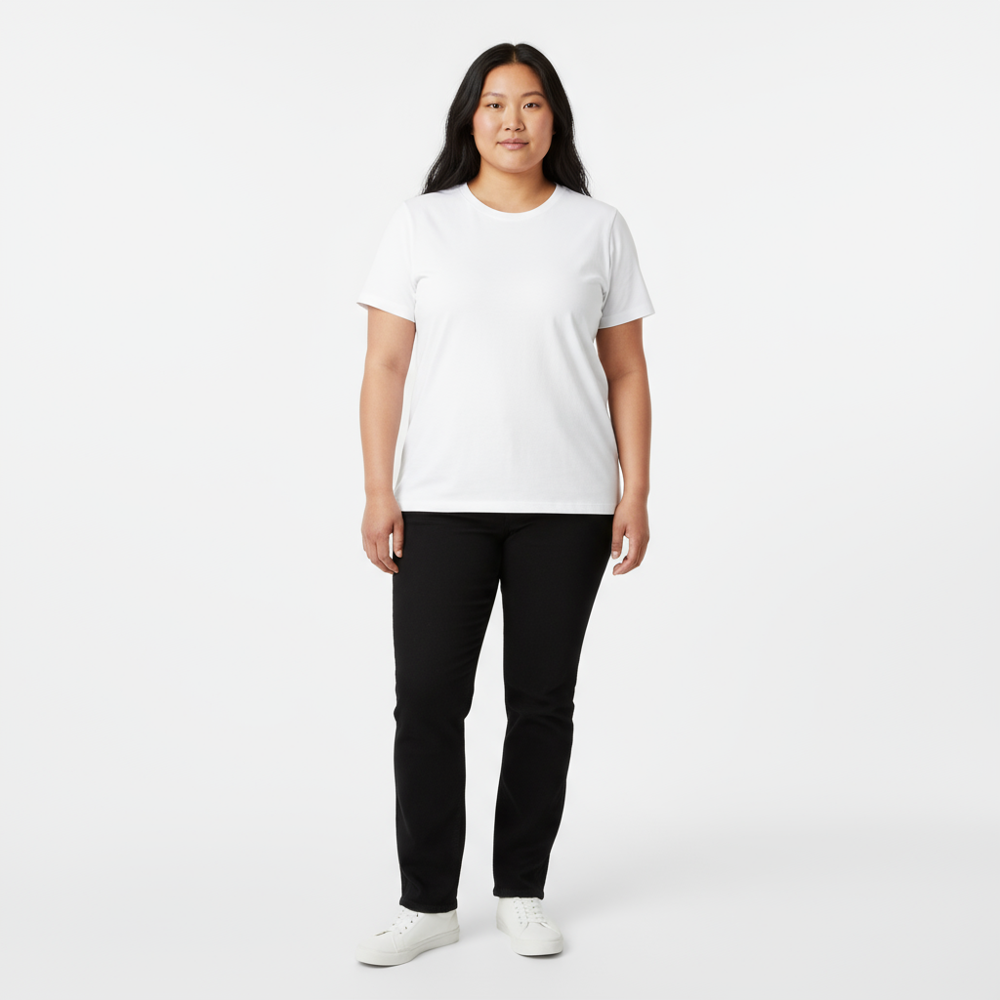
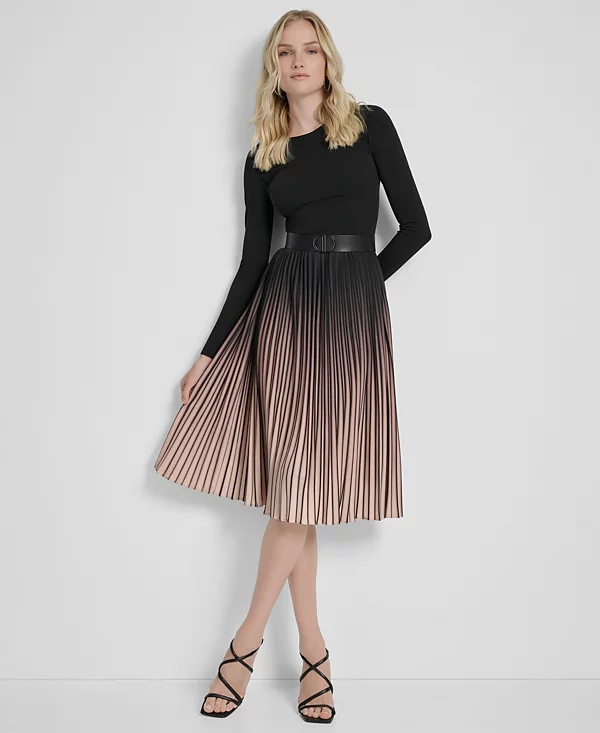
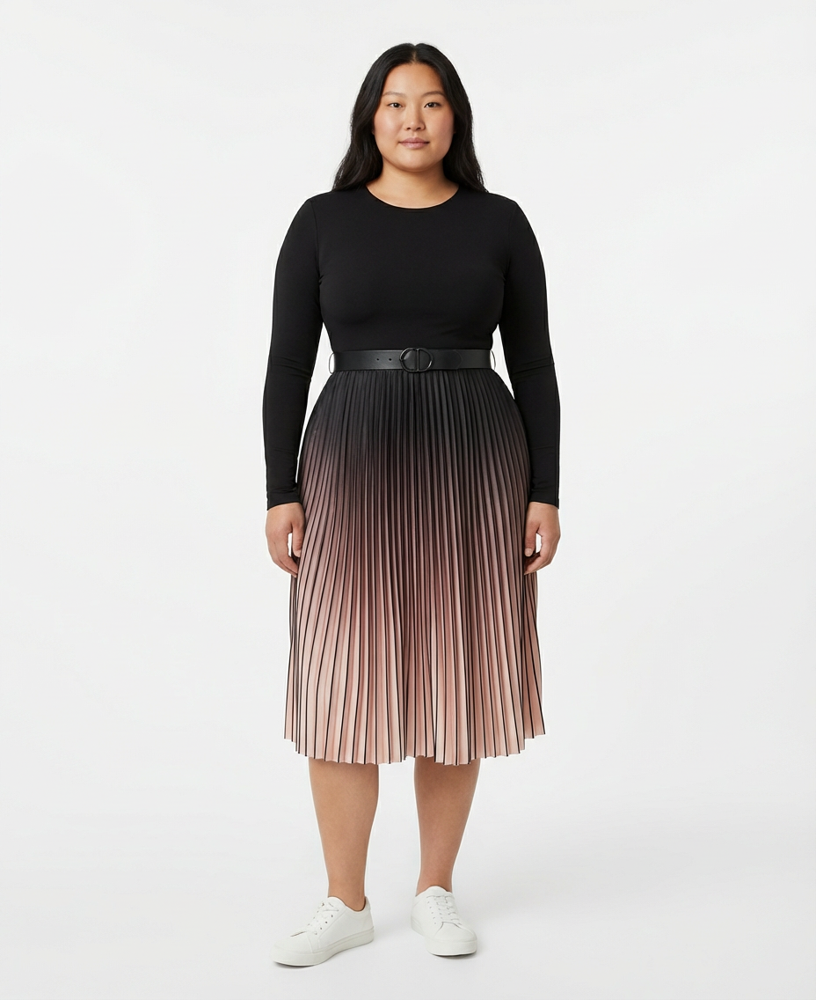
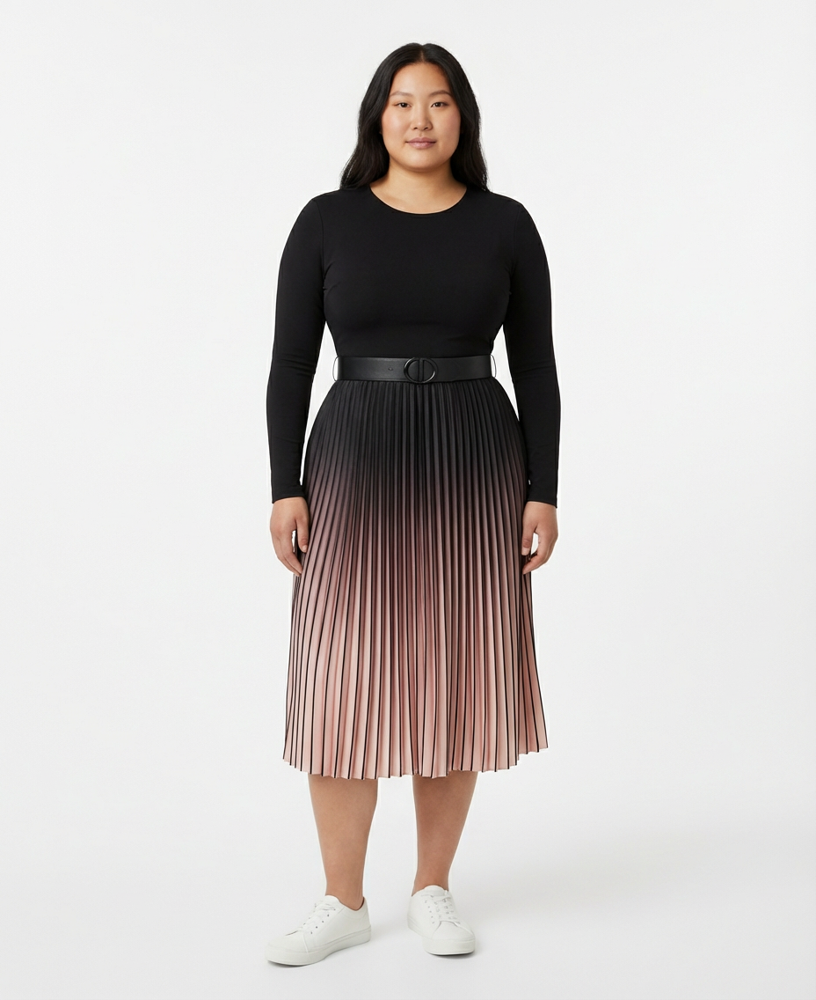
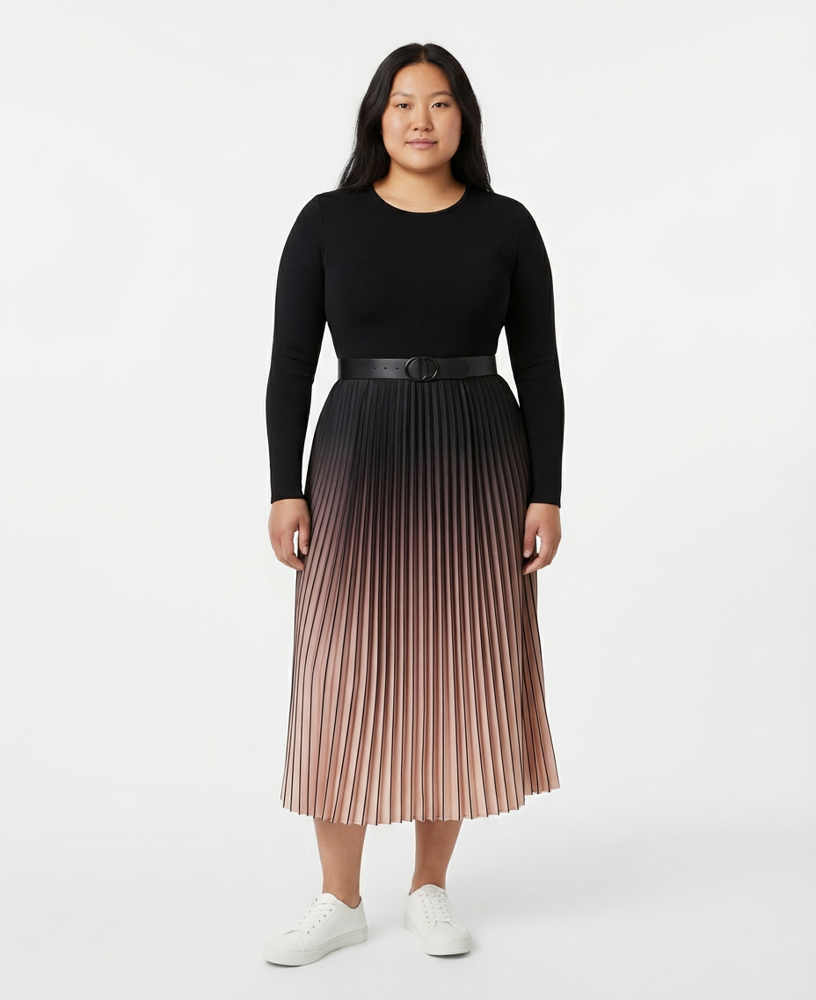
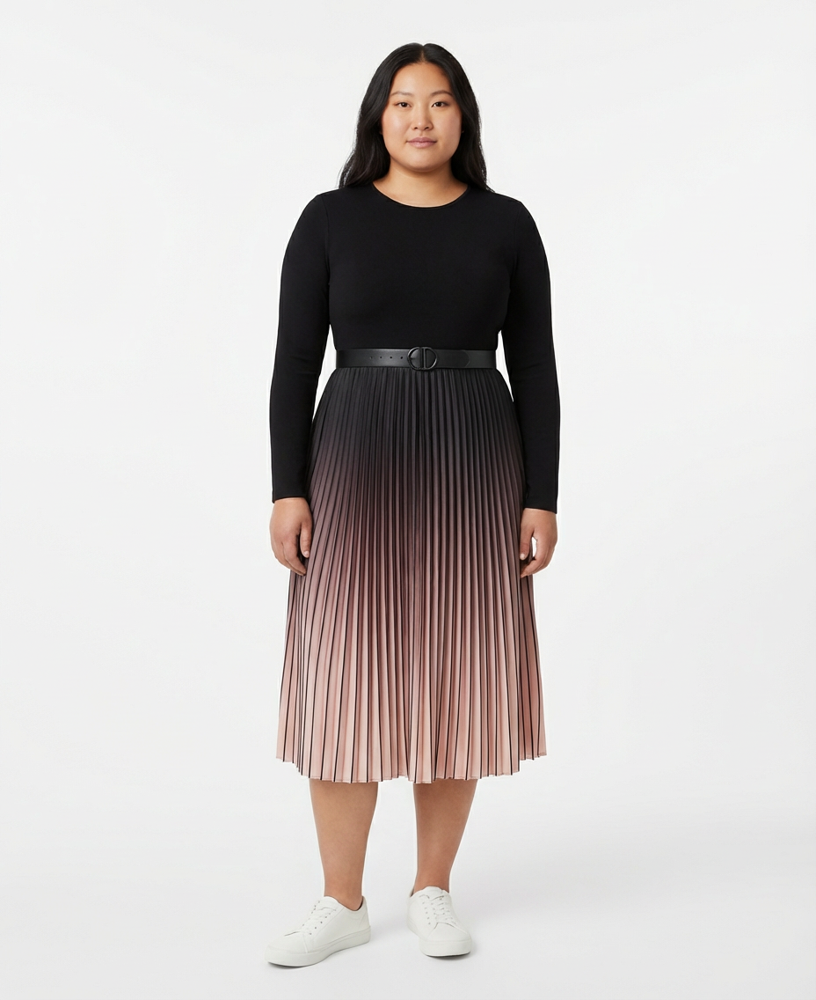
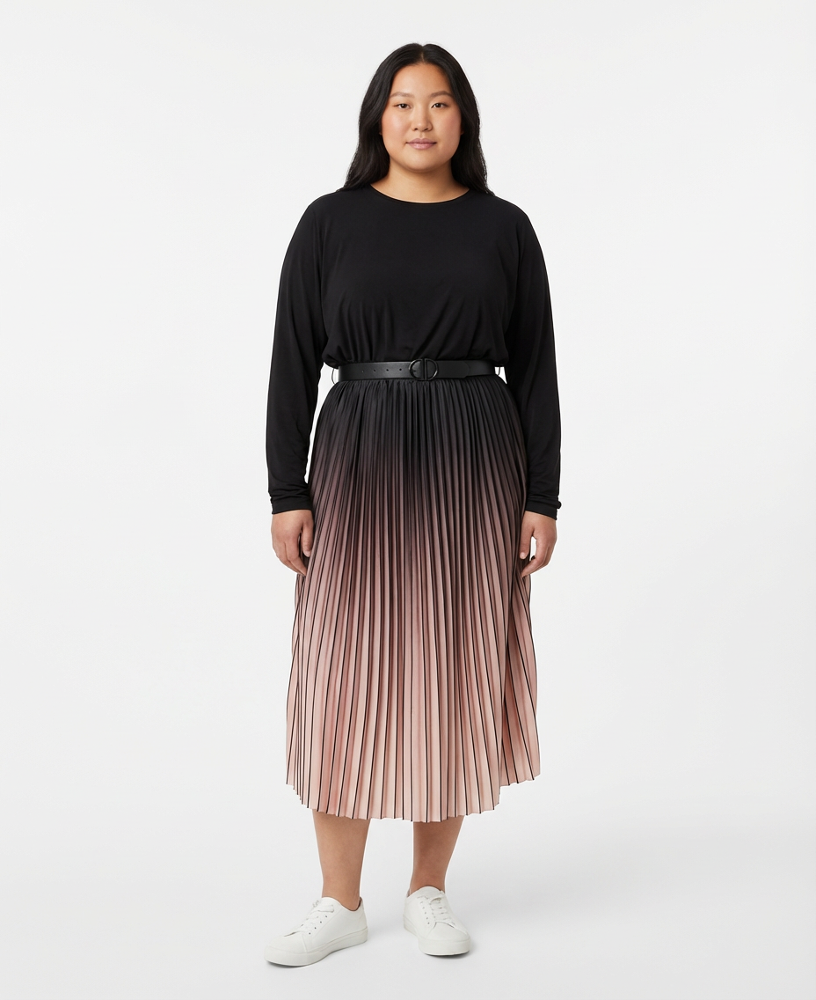

✔ Saved tryon_outputs/tryon_M.png
✔ Saved tryon_outputs/tryon_XL.png
✔ Saved tryon_outputs/tryon_L.png
✔ Saved tryon_outputs/tryon_XS.png
✔ Saved tryon_outputs/tryon_S.png


In [4]:
import os
import json
import base64
from typing import List, Dict, Tuple
from concurrent.futures import ThreadPoolExecutor, as_completed

from google import genai
from google.genai.types import GenerateContentConfig, Modality, Part
from google.cloud import storage

from IPython.display import HTML, display


# ====================================================
# CONFIG
# ====================================================
PROJECT_ID = os.getenv("GOOGLE_CLOUD_PROJECT", "consumer-genai-experiments")

# Use us-central1 for 2.5 Flash
ANALYSIS_LOCATION = os.getenv("GOOGLE_CLOUD_LOCATION", "us-central1")

# Gemini 3 Pro Image Preview is global-only in preview
VTO_LOCATION = "global"

ANALYSIS_MODEL = "gemini-2.5-flash"            # for body + outfit analysis + visual eval
VTO_MODEL      = "gemini-3-pro-image-preview"  # for virtual try-on images


# Two separate clients (vertexai=True, no api_key)
client_flash = genai.Client(
    vertexai=True,
    project=PROJECT_ID,
    location=ANALYSIS_LOCATION,
)

client_vto = genai.Client(
    vertexai=True,
    project=PROJECT_ID,
    location=VTO_LOCATION,
)

storage_client = storage.Client(project=PROJECT_ID)


# ====================================================
# BASIC HELPERS
# ====================================================
def load_local_image(path: str) -> bytes:
    with open(path, "rb") as f:
        return f.read()


def load_gcs_image(gs_path: str) -> bytes:
    """Load image bytes from a gs://bucket/path URL."""
    assert gs_path.startswith("gs://")
    bucket_name, blob_path = gs_path[5:].split("/", 1)
    bucket = storage_client.bucket(bucket_name)
    blob = bucket.blob(blob_path)
    return blob.download_as_bytes()


def load_product_info_text(path: str) -> str:
    """
    Load product information from a local file.
    - If it's JSON, pretty-print it.
    - Otherwise, treat as plain text.
    """
    if not path or not os.path.exists(path):
        return ""

    _, ext = os.path.splitext(path)
    ext = ext.lower()

    with open(path, "r", encoding="utf-8") as f:
        raw = f.read()

    if ext == ".json":
        try:
            obj = json.loads(raw)
            return json.dumps(obj, indent=2)
        except Exception:
            return raw

    # Truncate to keep prompt reasonable
    return raw[:6000]


def _image_part(image_bytes: bytes, mime_type: str = "image/png") -> Part:
    return Part.from_bytes(
        data=image_bytes,
        mime_type=mime_type,
    )


def _extract_image_bytes(response) -> bytes:
    """Return first inline_data image bytes from a Gemini response."""
    for cand in getattr(response, "candidates", []):
        content = getattr(cand, "content", None)
        if not content:
            continue
        for part in getattr(content, "parts", []):
            inline = getattr(part, "inline_data", None)
            if inline is not None and getattr(inline, "data", None) is not None:
                return inline.data
    raise RuntimeError("No image inline_data found in Gemini response")


def _extract_text(response) -> str:
    """Return concatenated text from a Gemini response."""
    texts = []
    for cand in getattr(response, "candidates", []):
        content = getattr(cand, "content", None)
        if not content:
            continue
        for part in getattr(content, "parts", []):
            if getattr(part, "text", None):
                texts.append(part.text)
    if not texts and hasattr(response, "text") and response.text:
        return response.text
    if not texts:
        raise RuntimeError("No text found in Gemini response")
    return "\n".join(texts).strip()


def _strip_md_fence(text: str) -> str:
    """
    Strip ``` or ```json fences if Gemini returns markdown-formatted JSON.
    """
    t = text.strip()
    if t.startswith("```"):
        lines = t.splitlines()
        # drop first line (``` or ```json)
        lines = lines[1:]
        # drop last fence if present
        if lines and lines[-1].strip().startswith("```"):
            lines = lines[:-1]
        return "\n".join(lines).strip()
    return t


# ====================================================
# 1) BODY ANALYSIS (Gemini 2.5 Flash)
# ====================================================
BODY_ANALYSIS_PROMPT = """
You are a fashion fit and body measurement assistant.

You receive a single PERSON_IMAGE of one person standing.
The person can be of any gender or presentation. From just this image,
estimate the person's body in the most realistic and practical way possible
for fashion fit.

Return a SHORT JSON object only (no explanation text) with keys:

{
  "estimated_height_in": number,        // approximate height in inches
  "bust_or_chest_in": number,          // fullest part of chest/bust
  "waist_in": number,                  // natural waist
  "hip_in": number,                    // fullest part of hips/seat
  "build": "slim|medium|curvy|broad|athletic",
  "posture_notes": "string",
  "confidence_0_to_1": number          // how confident you are in these estimates
}

Rules:
- Use reasonable, fashion-relevant ranges (for example: height 58-76 inches).
- This must work for all genders and body types.
- If unsure, still give your best numeric estimate rather than writing 'unknown'.
- Do NOT wrap JSON in backticks. Output must be plain JSON only.
""".strip()


def analyze_body_with_flash(
    person_bytes: bytes,
    person_mime: str = "image/png",
) -> str:
    """
    Use Gemini 2.5 Flash to estimate the person's body measurements from the image.
    """
    person_part = _image_part(person_bytes, mime_type=person_mime)

    response = client_flash.models.generate_content(
        model=ANALYSIS_MODEL,
        contents=[person_part, BODY_ANALYSIS_PROMPT],
        config=GenerateContentConfig(
            temperature=0.2,
            response_modalities=[Modality.TEXT],
        ),
    )

    body_json = _extract_text(response)
    body_json = _strip_md_fence(body_json)
    return body_json


# ====================================================
# 2) OUTFIT TYPE ANALYSIS (Gemini 2.5 Flash)
# ====================================================
OUTFIT_ANALYSIS_PROMPT = """
You are a fashion product expert.

You receive one OUTFIT_IMAGE (which may be a flat-lay, on-model photo,
or mannequin shot) plus optional PRODUCT_INFO_TEXT.

Your job is to produce a short, human-readable description that can be
used as OUTFIT_TYPE for a virtual try-on system.

Requirements for the description:
- 1 short sentence or phrase, NOT a paragraph.
- Mention garment pieces (e.g. "dress", "shirt and trousers", "blazer and jeans").
- If clear, mention whether it looks like menswear, womenswear, or unisex.
- Mention key style cues only if obvious (e.g. "slim-fit", "oversized hoodie").
- Do NOT include sizes, prices, or marketing fluff.
- No JSON, no bullet points, no extra commentary.

PRODUCT_INFO_TEXT (may be empty) is:

\"\"\"{product_info_text}\"\"\"

Return only the single sentence / phrase, nothing else.
""".strip()


def infer_outfit_type_with_flash(
    outfit_bytes: bytes,
    product_info_text: str = "",
    outfit_mime: str = "image/png",
) -> str:
    """
    Let Gemini 2.5 Flash look at the outfit image (plus optional product info)
    and return a short OUTFIT_TYPE description.
    """
    outfit_part = _image_part(outfit_bytes, mime_type=outfit_mime)

    prompt = OUTFIT_ANALYSIS_PROMPT.format(
        product_info_text=product_info_text or "No extra product info provided.",
    )

    response = client_flash.models.generate_content(
        model=ANALYSIS_MODEL,
        contents=[outfit_part, prompt],
        config=GenerateContentConfig(
            temperature=0.2,
            response_modalities=[Modality.TEXT],
        ),
    )

    text = _extract_text(response)
    text = _strip_md_fence(text).strip()
    return text


# ====================================================
# 3) VTO PROMPT (body JSON + size guide + product info + outfit_type)
# ====================================================
VTO_PROMPT_TEMPLATE = """
You are a fashion virtual try-on engine.

Inputs you receive:
1) PERSON_IMAGE (real person of any gender or body type).
2) OUTFIT_IMAGE (product photo for the clothing). THIS IS ONLY FOR GARMENT DESIGN
   (color, fabric, silhouette), NOT for pose, background, shoes, or camera angle.
3) BRAND_SIZE_GUIDE_IMAGE (table with Size | Bust/Chest (in) | Waist (in) | Hip/Seat (in)).
4) TARGET_SIZE (size we want to generate: XS, S, M, L, XL, etc.).
5) OUTFIT_TYPE: short description of the outfit, inferred from the product image.
6) ESTIMATED_BODY_MEASUREMENTS_JSON from a previous expert model:

{body_measurements_json}

7) PRODUCT_INFO_TEXT describing the garment's fabric, stretch, structure, drape,
   style, and how it is intended to fit (slim, relaxed, bodycon, oversized, tailored, etc.):

\"\"\"{product_info_text}\"\"\"

CRITICAL COMPOSITION RULES (must follow all):

- Use PERSON_IMAGE as the base canvas.
- Keep **exact same framing and crop** as PERSON_IMAGE:
  • same camera distance and zoom
  • same head-to-toe composition
  • do NOT zoom in or out
  • do NOT crop the person differently
- Keep the **original background** from PERSON_IMAGE. Do NOT use the background
  from the product/OUTFIT_IMAGE.
- Keep the **person's original shoes/footwear** exactly as in PERSON_IMAGE:
  • do NOT change shoe color, style, or heel
  • ignore shoes visible in the OUTFIT_IMAGE
  • the new skirt/pants/dress should end at the right place above those shoes,
    but the shoes themselves must remain unchanged.
- Keep the same pose and body proportions as PERSON_IMAGE.
- Only the clothing on the body (top, skirt, dress, pants, blazer, etc.) should change.

FIT & SIZE LOGIC:

1. Use ESTIMATED_BODY_MEASUREMENTS_JSON as the primary reference for the person's body:
   height, bust/chest, waist, hips/seat, and build.

2. Read the BRAND_SIZE_GUIDE_IMAGE carefully and use PRODUCT_INFO_TEXT and OUTFIT_TYPE
   to understand:
   - whether this is menswear, womenswear, or unisex
   - which garment pieces are involved (shirt, pants, blazer, tie, dress, skirt, etc.)
   - whether the item is meant to be fitted, relaxed, oversized, or tailored.

3. When rendering TARGET_SIZE, apply realistic fit rules:
   - Smaller than the best/true size → visibly tighter but still plausible.
   - Best size → balanced, comfortable, and consistent with how the product image looks.
   - Larger than the best/true size → looser / more ease and drape, but still realistic.

4. Preserve:
   - Person’s face, skin tone, body shape, pose, and background from PERSON_IMAGE.
   - Outfit color, pattern, silhouette, and key design details from OUTFIT_IMAGE.

Strict rules:
- Do NOT change the garment category (e.g., do not turn a dress into a suit or
  a skirt into trousers).
- Do NOT change the shoes at all.
- Do NOT change the camera angle, zoom, framing, or background.
- Only adjust how the garment fits (tightness, looseness, wrinkles, drape) per size.

Generate ONE highly realistic try-on image for the given TARGET_SIZE and OUTFIT_TYPE,
following all composition rules above.

TARGET_SIZE: {target_size}
OUTFIT_TYPE: {outfit_type}
""".strip()


def generate_tryon_for_size(
    person_bytes: bytes,
    outfit_bytes: bytes,
    sizeguide_bytes: bytes,
    *,
    body_measurements_json: str,
    target_size: str,
    outfit_type: str,
    product_info_text: str = "",
    person_mime: str = "image/png",
    outfit_mime: str = "image/png",
    size_mime: str = "image/png",
) -> bytes:
    """
    Generate a single virtual try-on for a specific size.
    """
    prompt = VTO_PROMPT_TEMPLATE.format(
        target_size=target_size,
        outfit_type=outfit_type,
        body_measurements_json=body_measurements_json,
        product_info_text=product_info_text or "No extra product info provided.",
    )

    person_part    = _image_part(person_bytes,    mime_type=person_mime)
    outfit_part    = _image_part(outfit_bytes,    mime_type=outfit_mime)
    sizeguide_part = _image_part(sizeguide_bytes, mime_type=size_mime)

    contents = [
        person_part,
        outfit_part,
        sizeguide_part,
        prompt,
    ]

    response = client_vto.models.generate_content(
        model=VTO_MODEL,
        contents=contents,
        config=GenerateContentConfig(
            temperature=0.2,  # lowered for less "creative" changes
            response_modalities=[Modality.IMAGE],
        ),
    )

    return _extract_image_bytes(response)


# ====================================================
# 4) VISUAL BEST-SIZE EVALUATION (uses outfit + all try-ons)
# ====================================================
BEST_SIZE_VISUAL_PROMPT = """
You are an expert fashion fit stylist.

You are given:
- ORIGINAL PRODUCT OUTFIT IMAGE (the reference for how the garment or full outfit
  is supposed to look on a model).
- Multiple TRY-ON images of the SAME PERSON wearing the SAME OUTFIT
  in DIFFERENT SIZES. Each try-on image is paired with a text label like "TRY_ON size M".

You also receive:
- ESTIMATED_BODY_MEASUREMENTS_JSON for the person:
{body_measurements_json}

- PRODUCT_INFO_TEXT about fabric, stretch, silhouette, and intended fit:
\"\"\"{product_info_text}\"\"\"

- AVAILABLE_SIZES in order from smallest to largest: [{available_sizes}]

Your main guidance:
- Compare each TRY-ON image to the ORIGINAL PRODUCT OUTFIT IMAGE.
- The BEST SIZE should preserve the garment's intended style:
  similar silhouette, drape, proportions, and fit ease as seen in the product image,
  while still looking realistic on this specific person's body and posture.

When assessing fit, consider garment types and all genders:
- Shirts/tops: shoulder seam position, chest smoothness, button gaping, sleeve width and length.
- Pants/trousers/jeans: waistband comfort, seat and thigh tension, knee ease, hem length and break.
- Blazers/jackets: shoulder line, chest and lapel area, button closure, sleeve length, overall drape.
- Dresses/one-piece garments: bust, waist, hip/seat fit, and how the hem and fabric behave.
- Ties: approximate length relative to torso (often near belt line), not extremely too short or too long.

Your tasks, using VISUAL appearance as the main signal:

1) Choose EXACTLY ONE size as the BEST overall fit for everyday wear.
   - It should look balanced and comfortable, close to how the designer intended,
     and visually match the original product image's style and ease as much as possible.
   - Avoid sizes that look obviously too tight or too baggy compared to the product image.

2) Also choose:
   - ONE smaller size (if available) that you would recommend for a more fitted / sharp / bodycon look.
   - ONE larger size (if available) that you would recommend for a more relaxed / oversized / roomy look.
   If there is no smaller or larger size than the best, use null for that field.

3) Return a SINGLE JSON object with this shape (no extra commentary):

{{
  "best_size": "size_label_here",
  "best_reason": "short 1-2 sentence explanation of why this looks like the best fit",
  "alt_smaller_size": "size_label_or_null",
  "alt_smaller_reason": "very short reason, or empty string if null",
  "alt_larger_size": "size_label_or_null",
  "alt_larger_reason": "very short reason, or empty string if null"
}}

Rules:
- Use ONLY size labels from AVAILABLE_SIZES.
- Do NOT wrap JSON in backticks or markdown fences.
- Use null (not the string "null") when there is no smaller or larger size.
""".strip()


def evaluate_best_size_visually(
    body_measurements_json: str,
    product_info_text: str,
    sizes: List[str],
    tryon_results: Dict[str, bytes],
    outfit_bytes: bytes,
    outfit_mime: str = "image/png",
) -> Tuple[str, str, str, str, str, str]:
    """
    Send all try-on images + the original outfit image to Gemini 2.5 Flash
    and let it visually pick:

      - best_size
      - alt_smaller_size
      - alt_larger_size
    """
    ordered_sizes = [s for s in sizes if s in tryon_results]

    prompt = BEST_SIZE_VISUAL_PROMPT.format(
        body_measurements_json=body_measurements_json,
        product_info_text=product_info_text or "No extra product info provided.",
        available_sizes=", ".join(ordered_sizes),
    )

    contents: List = []

    # 1) Original outfit product image (reference)
    contents.append("ORIGINAL PRODUCT OUTFIT IMAGE (reference for silhouette, drape, and intended fit)")
    contents.append(_image_part(outfit_bytes, mime_type=outfit_mime))

    # 2) All try-on images, each tagged with its size
    for sz in ordered_sizes:
        contents.append(f"TRY_ON_IMAGE size {sz}")
        contents.append(_image_part(tryon_results[sz], mime_type="image/png"))

    # 3) Main reasoning prompt
    contents.append(prompt)

    response = client_flash.models.generate_content(
        model=ANALYSIS_MODEL,
        contents=contents,
        config=GenerateContentConfig(
            temperature=0.1,
            response_modalities=[Modality.TEXT],
        ),
    )

    text = _extract_text(response)
    text = _strip_md_fence(text)

    data = json.loads(text)

    best_size          = data["best_size"]
    best_reason        = data.get("best_reason", "")
    alt_smaller_size   = data.get("alt_smaller_size")
    alt_smaller_reason = data.get("alt_smaller_reason", "")
    alt_larger_size    = data.get("alt_larger_size")
    alt_larger_reason  = data.get("alt_larger_reason", "")

    print("Visual size evaluation:", json.dumps(data, indent=2))
    return (
        best_size,
        best_reason,
        alt_smaller_size,
        alt_smaller_reason,
        alt_larger_size,
        alt_larger_reason,
    )


# ====================================================
# 5) MULTI-SIZE GENERATION (parallel, + outfit/body analysis)
# ====================================================
def generate_tryon_for_sizes(
    person_bytes: bytes,
    outfit_bytes: bytes,
    sizeguide_bytes: bytes,
    sizes: List[str],
    product_info_text: str = "",
    *,
    person_mime: str = "image/png",
    outfit_mime: str = "image/png",
    size_mime: str = "image/png",
) -> Tuple[Dict[str, bytes], str, str, str, str, str, str, str]:
    """
    Full pipeline:
      1) Analyze body (once)
      2) Analyze outfit image → auto outfit_type
      3) Generate try-ons for ALL requested sizes in parallel (max_workers=5)
      4) Send all outputs + outfit image to Gemini 2.5 Flash to visually pick best size
         + recommendations for 1 smaller and 1 larger size.

    Returns:
      results: {size_label -> bytes}
      outfit_type_used: str
      best_size, best_reason,
      alt_smaller_size, alt_smaller_reason,
      alt_larger_size, alt_larger_reason
    """
    # --- Step 1: Body analysis
    print("Analyzing body with Gemini 2.5 Flash...")
    body_json = analyze_body_with_flash(person_bytes, person_mime=person_mime)
    print("Body analysis JSON:\n", body_json)

    # --- Step 2: Outfit type analysis
    print("\nAnalyzing outfit type from product image...")
    outfit_type = infer_outfit_type_with_flash(
        outfit_bytes=outfit_bytes,
        product_info_text=product_info_text,
        outfit_mime=outfit_mime,
    )
    print("Detected outfit_type:", outfit_type)

    results: Dict[str, bytes] = {}

    # --- Step 3: Parallel generation of all requested sizes
    print("\nGenerating try-ons in parallel (max_workers=5)...")

    def job(size_label: str):
        print(f"[Worker] Generating size {size_label} ...")
        img_bytes = generate_tryon_for_size(
            person_bytes=person_bytes,
            outfit_bytes=outfit_bytes,
            sizeguide_bytes=sizeguide_bytes,
            body_measurements_json=body_json,
            target_size=size_label,
            outfit_type=outfit_type,
            product_info_text=product_info_text,
            person_mime=person_mime,
            outfit_mime=outfit_mime,
            size_mime=size_mime,
        )
        return size_label, img_bytes

    with ThreadPoolExecutor(max_workers=5) as executor:
        future_map = {executor.submit(job, sz): sz for sz in sizes}

        for future in as_completed(future_map):
            size_label, img_bytes = future.result()
            results[size_label] = img_bytes
            print(f"✓ Finished: size {size_label}")

    # --- Step 4: Visual best-size evaluation
    (
        best_size,
        best_reason,
        alt_smaller_size,
        alt_smaller_reason,
        alt_larger_size,
        alt_larger_reason,
    ) = evaluate_best_size_visually(
        body_measurements_json=body_json,
        product_info_text=product_info_text,
        sizes=sizes,
        tryon_results=results,
        outfit_bytes=outfit_bytes,
    )

    print("\n================ SIZE RECOMMENDATION ================")
    print("OUTFIT_TYPE used:", outfit_type)
    print(f"Proposed size for this model & outfit: {best_size}")
    if best_reason:
        print("Why:", best_reason)
    if alt_smaller_size:
        print(f"More fitted option: {alt_smaller_size} – {alt_smaller_reason}")
    if alt_larger_size:
        print(f"More relaxed option: {alt_larger_size} – {alt_larger_reason}")
    print("=====================================================\n")

    return (
        results,
        outfit_type,
        best_size,
        best_reason,
        alt_smaller_size,
        alt_smaller_reason,
        alt_larger_size,
        alt_larger_reason,
    )


# ====================================================
# 6) DISPLAY GRID IN JUPYTER
# ====================================================
def _b64_png(data: bytes) -> str:
    return base64.b64encode(data).decode("utf-8")


def show_tryon_grid(
    person_bytes: bytes,
    outfit_bytes: bytes,
    results: Dict[str, bytes],
    sizes_order: List[str] = None,
    title_person: str = "Model",
    title_outfit: str = "Outfit",
    best_size: str = None,
    best_reason: str = "",
    alt_smaller_size: str = None,
    alt_smaller_reason: str = "",
    alt_larger_size: str = None,
    alt_larger_reason: str = "",
):
    """
    Display:
      Row 1: Model | Outfit
      Row 2: one cell per size with size header above image.
      Best size is highlighted; text recommendations shown below.
    """
    if sizes_order is None:
        canonical = ["XXS", "XS", "S", "M", "L", "XL", "XXL", "3XL", "4XL"]
        sizes_order = [s for s in canonical if s in results] or sorted(results.keys())

    person_b64 = _b64_png(person_bytes)
    outfit_b64 = _b64_png(outfit_bytes)
    size_to_b64 = {sz: _b64_png(img) for sz, img in results.items()}

    html = []
    html.append("<div style='font-family:Arial,sans-serif;'>")

    # Header
    if best_size:
        html.append(
            f"<h3>Proposed size for this model and outfit: {best_size}</h3>"
        )

    html.append("<table style='border-collapse:collapse; text-align:center;'>")

    # Row 1: model + outfit
    html.append("<tr>")
    html.append(
        f"<td style='padding:10px;'>"
        f"<div style='font-weight:bold; margin-bottom:5px;'>{title_person}</div>"
        f"<img src='data:image/png;base64,{person_b64}' "
        f"style='max-width:240px; height:auto; border:1px solid #ccc; border-radius:4px;'/>"
        f"</td>"
    )
    html.append(
        f"<td style='padding:10px;'>"
        f"<div style='font-weight:bold; margin-bottom:5px;'>{title_outfit}</div>"
        f"<img src='data:image/png;base64,{outfit_b64}' "
        f"style='max-width:240px; height:auto; border:1px solid #ccc; border-radius:4px;'/>"
        f"</td>"
    )
    html.append("</tr>")

    # Spacer row
    html.append("<tr><td colspan='2' style='height:20px;'></td></tr>")

    # Row 2: one cell per size
    html.append("<tr>")
    for sz in sizes_order:
        if sz not in size_to_b64:
            continue
        b64 = size_to_b64[sz]

        if best_size and sz == best_size:
            border_style = "3px solid #4CAF50"
            label = f"Size {sz} (best fit)"
        else:
            border_style = "1px solid #ccc"
            label = f"Size {sz}"

        html.append(
            "<td style='padding:10px; vertical-align:top;'>"
            f"<div style='font-weight:bold; margin-bottom:5px;'>{label}</div>"
            f"<img src='data:image/png;base64,{b64}' "
            f"style='max-width:220px; height:auto; border:{border_style}; border-radius:4px;'/>"
            "</td>"
        )
    html.append("</tr>")
    html.append("</table>")

    # Recommendations section
    rec_parts = []
    if best_size and best_reason:
        rec_parts.append(f"<b>{best_size}</b>: {best_reason}")
    if alt_smaller_size:
        rec_parts.append(f"<b>{alt_smaller_size}</b> (more fitted): {alt_smaller_reason}")
    if alt_larger_size:
        rec_parts.append(f"<b>{alt_larger_size}</b> (more relaxed): {alt_larger_reason}")

    if rec_parts:
        html.append(
            "<div style='margin-top:15px; font-size:14px; text-align:left;'>"
            + "<br>".join(rec_parts)
            + "</div>"
        )

    html.append("</div>")

    display(HTML("".join(html)))


# ====================================================
# 7) EXAMPLE USAGE
# ====================================================
person_bytes      = load_local_image("person.png")
outfit_bytes      = load_local_image("outfit.png")
sizeguide_bytes   = load_local_image("size-chart.png")   # dress, shirt, suit, etc
product_info_path = "product-info.txt"   # or .json, etc.

product_info_text = load_product_info_text(product_info_path)

sizes = ["XS", "S", "M", "L", "XL"]

(
    results,
    outfit_type_used,
    best_size,
    best_reason,
    alt_smaller_size,
    alt_smaller_reason,
    alt_larger_size,
    alt_larger_reason,
) = generate_tryon_for_sizes(
    person_bytes=person_bytes,
    outfit_bytes=outfit_bytes,
    sizeguide_bytes=sizeguide_bytes,
    sizes=sizes,
    product_info_text=product_info_text,
)

print("Final OUTFIT_TYPE used by the pipeline:", outfit_type_used)

# Show grid in notebook
show_tryon_grid(
    person_bytes=person_bytes,
    outfit_bytes=outfit_bytes,
    results=results,
    best_size=best_size,
    best_reason=best_reason,
    alt_smaller_size=alt_smaller_size,
    alt_smaller_reason=alt_smaller_reason,
    alt_larger_size=alt_larger_size,
    alt_larger_reason=alt_larger_reason,
)

# ====================================================
# 8) SAVE ONLY TRY-ON IMAGES LOCALLY
# ====================================================
OUTPUT_DIR = "tryon_outputs"
os.makedirs(OUTPUT_DIR, exist_ok=True)

for sz, img_bytes in results.items():
    out_path = os.path.join(OUTPUT_DIR, f"tryon_{sz}.png")
    with open(out_path, "wb") as f:
        f.write(img_bytes)
    print(f"✔ Saved {out_path}")